In [1]:
import mdtraj as md
import numpy as np
import scipy
from scipy.stats import linregress
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from itertools import combinations
import sys, os, re
from msmbuilder.decomposition import tICA as msm_tICA
from msmbuilder.featurizer import AtomPairsFeaturizer

sys.path.append(os.path.dirname(os.getcwd())) 
import amuset_tica

In [2]:
Ks = np.load("9d9f_Ks.npy")
lag_times = range(1, 301) # 1 frame = 2 ps
basis_list = np.array([[[-1.0939795878279368, 2], [0.6151525780598074, 2], [0.6025909988440169, 2], [-0.9219408339178378, 2]], [[-1.0939795878279368, 2], [0.6151525780598074, 2], [0.6025909988440169, 2], [-0.9219408339178378, 2]]])
print(Ks.shape)

(300, 25, 25)


Time = 1 ps
[129.58887188604098, 12.060516105962474, 5.1321750202900205, 3.188149100422746, 2.6173981305822247]
Time = 2 ps
[171.54323036584574, 16.17615470136462, 6.822884745542547, 4.350125517091048, 3.588804280895245]
Time = 3 ps
[200.1216369948689, 18.98586236225116, 8.047159465198462, 5.159872740727489, 4.311464011319565]
Time = 4 ps
[221.78680845347142, 21.1167262524762, 9.020322932082848, 5.7955185805334954, 4.918346854524301]
Time = 5 ps
[238.9121544611986, 22.828798042195086, 9.848308731331073, 6.342438196203934, 5.465515604375678]
Time = 6 ps
[253.10064744377092, 24.257910208562546, 10.579001358949492, 6.813300522437953, 5.951984389022556]
Time = 7 ps
[265.0218788604805, 25.453440001459168, 11.225177452852552, 7.234174126674755, 6.400205894434481]
Time = 8 ps
[275.4389792810564, 26.50979679048366, 11.833086529737555, 7.6123829484808425, 6.833126551784874]
Time = 9 ps
[284.65217448415655, 27.45974523528053, 12.384495737549003, 7.991079551818606, 7.248835633323741]
Time = 10 ps

ITS.shape = (5, 300)


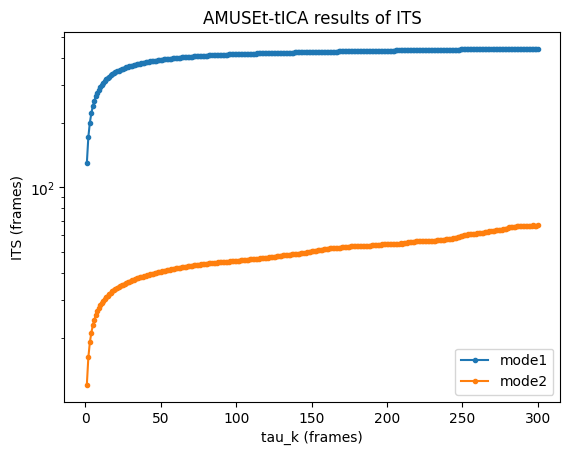

Current date and time: 2026-03-28 23:09:49.002062


In [3]:
ITSs, Es, Vs = [], [], []
for i in range(len(lag_times)):
    evK, vrK = np.linalg.eig(Ks[i])
    idx = np.argsort(evK)[::-1]
    evK = evK[idx]
    vrK = vrK[:,idx]
    
    Es.append(evK)
    Vs.append(vrK)
    print("Time =", lag_times[i], 'ps')
    ITSs.append([-lag_times[i]/np.log(Es[-1][j]) for j in range(1,6)])
    print(ITSs[-1])

fig1, ax1 = plt.subplots()
ax1.set_yscale('log')
plt.xlabel("lag time (frames)")
plt.ylabel("ITS (frames)")

ITS = np.array(ITSs).T
print("ITS.shape =", ITS.shape)
for i in range(2):#(ITS.shape[0]):
    ax1.plot(lag_times, ITS[i], '.-', label='mode'+str(i+1)) 
plt.xlabel('tau_k (frames)')
plt.ylabel('ITS (frames)')
plt.title('AMUSEt-tICA results of ITS')
plt.legend()
plt.show()

from datetime import datetime
print(f"Current date and time: {datetime.now()}")

In [4]:
# ============================================================
# 1. Core regression: fit M from K(t+1) ≈ K(t) M
# ============================================================

def fit_M_from_K_sequence(Ks, st=0, gap=1, num_pair=None, enforce_hermitian_M=False, rcond=None):
    """
    Fit M in the model K(t+1) ≈ K(t) M via least squares.

    Parameters
    ----------
    Ks : list or array-like of shape [T, d, d]
        Sequence of Hermitian (or general) matrices K(t),
        t = 0, ..., T-1.
    enforce_hermitian_M : bool, optional
        If True, M is projected onto the Hermitian cone:
        M <- (M + M^†) / 2
    rcond : float or None
        Passed to np.linalg.lstsq for numerical stability.

    Returns
    -------
    M : (d, d) np.ndarray
        Estimated propagator.
    info : dict
        Some diagnostics: residuals, norms, etc.
    """
    Ks = np.asarray(Ks)
    T, d1, d2 = Ks.shape
    assert d1 == d2, "K(t) must be square."
    if st < 0:
        st = T - st
    assert gap > 0, 'gap must be positive.'
    d = d1

    if T < st + gap + 1:
        raise ValueError("Need at least 2 valid matrices K(t) to fit M.")

    # Build stacked system:
    #   X M ≈ Y
    # where X = block rows of K(0..T-2), Y = block rows of K(1..T-1)
    X = Ks[st:-gap].reshape(-1, d)
    Y = Ks[st+gap:].reshape(-1, d)

    # Solve least squares: X M ≈ Y
    # np.linalg.lstsq handles complex numbers and uses SVD internally.
    M, residuals, rank, s = np.linalg.lstsq(X, Y, rcond=rcond)

    if enforce_hermitian_M:
        M = 0.5 * (M + M.conj().T)

    # Compute residuals in matrix form: R(t) = K(t+1) - K(t) M
    R_list = []
    rel_norms = []
    end_point = T-gap
    if num_pair and num_pair < end_point - st:
        end_point = st+num_pair
    for t in range(st, end_point):
        K_pred = Ks[t] @ M
        R = Ks[t + gap] - K_pred
        R_list.append(R)
        num = np.linalg.norm(R, ord="fro")
        den = np.linalg.norm(Ks[t + gap], ord="fro") + 1e-15
        rel_norms.append(num / den)

    info = {
        "residuals": np.array(R_list),      # shape: (T-1, d, d)
        "relative_residual_norms": np.array(rel_norms),  # length T-1
        "lstsq_residuals_raw": residuals,
        "rank_X": rank,
        "singular_values_X": s,
    }

    return M, info


# ============================================================
# 2. Fit A from K(0) ≈ A M
# ============================================================

def fit_A_from_K0_and_M(K0, M):
    """
    Fit A in the model K(0) ≈ A M using pseudoinverse.

    Parameters
    ----------
    K0 : (d, d) array
        First matrix in the sequence, K(0).
    M : (d, d) array
        Propagator matrix.

    Returns
    -------
    A : (d, d) array
    """
    M_pinv = np.linalg.pinv(M)
    A = K0 @ M_pinv
    return A


# ============================================================
# 3. Generate predicted K(t) from A and M
# ============================================================

def generate_K_from_A_M(A, M, T):
    """
    Generate model-predicted K(t) = A M^t for t = 0..T-1.

    Parameters
    ----------
    A : (d, d) array
    M : (d, d) array
    T : int
        Number of time steps.

    Returns
    -------
    K_model : (T, d, d) array
    """
    d = A.shape[0]
    K_model = np.zeros((T, d, d), dtype=complex if np.iscomplexobj(A) or np.iscomplexobj(M) else float)
    Mt = np.eye(d, dtype=K_model.dtype)
    for t in range(T):
        Mt = Mt @ M
        K_model[t] = A @ Mt
    return K_model


# CVs v.s. theta1&2

In [5]:
theta = []
for i in range(1,41):
    tmp = np.load(f'9d9f_theta\\traj{i}.npy')
    theta.append(tmp)

theta = np.asarray(theta).reshape((-1, 2))
theta.shape

(2000040, 2)

In [6]:
basis_list, basis_list.shape

(array([[[-1.09397959,  2.        ],
         [ 0.61515258,  2.        ],
         [ 0.602591  ,  2.        ],
         [-0.92194083,  2.        ]],
 
        [[-1.09397959,  2.        ],
         [ 0.61515258,  2.        ],
         [ 0.602591  ,  2.        ],
         [-0.92194083,  2.        ]]]),
 (2, 4, 2))

## 1. GraphVAMPnets 

In [8]:
GraphVAMP_cv = np.load('graphvampnets_cvs_50epochs.npy')
GraphVAMP_cv.shape

(40, 50001, 2)

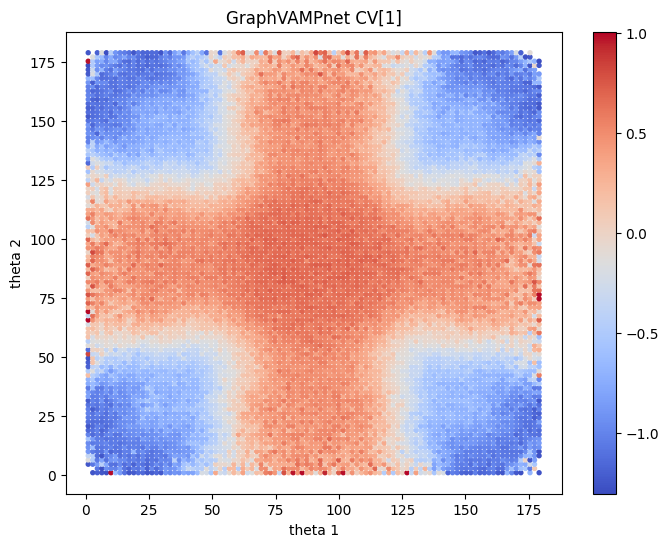

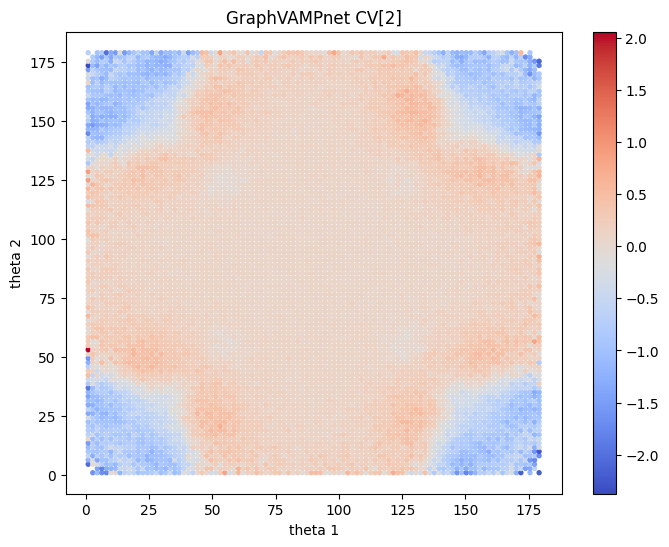

In [9]:
GraphVAMP_cv2D = GraphVAMP_cv.reshape((-1, 2))
from scipy.stats import binned_statistic_2d

nx, ny = 100, 100

for i in range(2):
    z_mean, x_edges, y_edges, _ = binned_statistic_2d(
        theta[:, 0], theta[:, 1], GraphVAMP_cv2D[:, i], statistic="mean", bins=[nx, ny]
    )

    mask = ~np.isnan(z_mean)

    x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing="ij")
    
    plt.figure(figsize=(8,6))
    sc = plt.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm")
    plt.colorbar(sc)
    plt.xlabel("theta 1")
    plt.ylabel("theta 2")
    plt.title(f"GraphVAMPnet CV[{i+1}]")
    plt.show()


-1.3694853 -0.009376098 1.0680306
-3.008755 0.015080043 3.514576


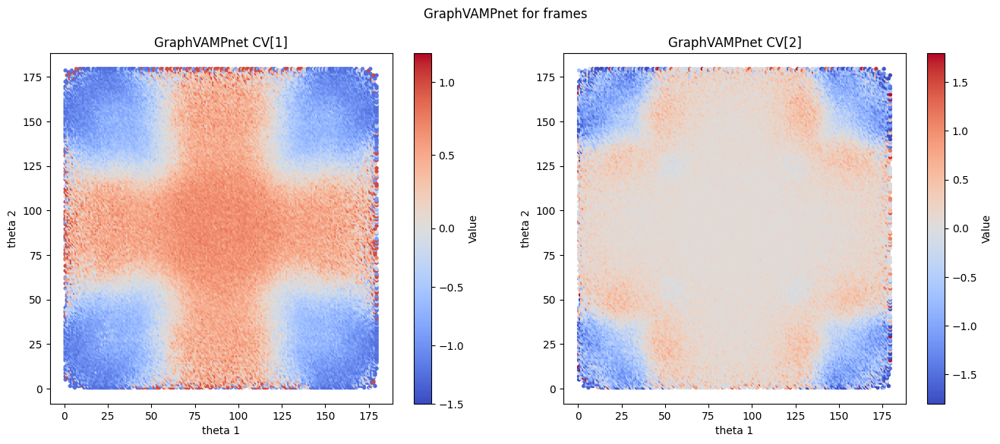

In [16]:
from scipy.stats import binned_statistic_2d

nx, ny = 200, 200
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
plots_save = []

for i, ax in enumerate(axes.ravel()):
    CVi = GraphVAMP_cv2D[:, i]
    print(np.min(CVi), np.mean(CVi), np.max(CVi))
    
    z_mean, x_edges, y_edges, _ = binned_statistic_2d(
        theta[:, 0], theta[:, 1], CVi, statistic="mean", bins=[nx, ny]
    )

    mask = ~np.isnan(z_mean)

    x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing="ij")
    if i == 0:
        norm = colors.TwoSlopeNorm(vmin=-1.5, vcenter=0, vmax=1.2)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    elif i == 1:
        norm = colors.TwoSlopeNorm(vmin=-1.8, vcenter=0, vmax=1.8)#np.median(CVi)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    else:
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm")
    ax.set_xlabel("theta 1")
    ax.set_ylabel("theta 2")
    ax.set_title(f"GraphVAMPnet CV[{i+1}]")
    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label("Value")
    plots_save.append(z_mean)

    #     arr[np.isnan(arr)] = -10
    
fig.suptitle('GraphVAMPnet for frames')
plt.show()

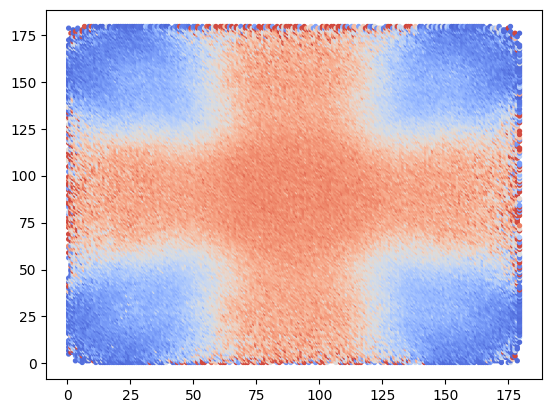

CV[1] done


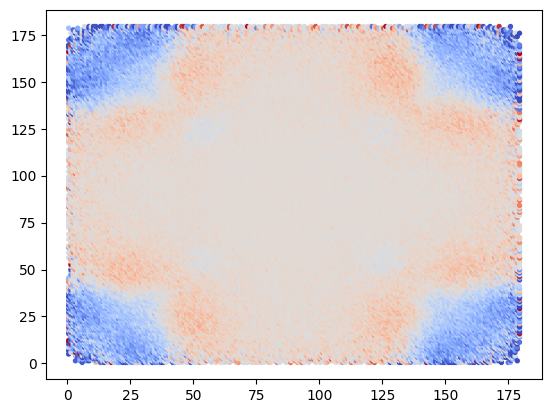

CV[2] done


In [18]:
x_out = Xc.reshape((-1))
y_out = Yc.reshape((-1))

vmin = [-1.5, -1.8]
vmean = [0, 0]
vmax = [1.2, 1.8]

for i in range(len(plots_save)):
    data_output = plots_save[i].reshape((-1))
    np.nan_to_num(data_output, nan=-10, copy=False)
    with open(f"9d9f_GraphVAMPnet-mode{i+1}_data.txt", "w") as f:
        mask = data_output == -10
        norm = colors.TwoSlopeNorm(vmin=vmin[i], vcenter=vmean[i], vmax=vmax[i])
        plt.scatter(x_out[~mask], y_out[~mask], c=data_output[~mask], s=8, cmap="coolwarm", norm=norm)
        plt.show()
        for j in range(len(data_output)):
            f.write(f"{x_out[j]:.3f} {y_out[j]:.3f} {data_output[j]:.10f}\n")
    
    print(f"CV[{i+1}] done")

## 2. Unsorted tICs

In [27]:
CV_pwd = np.load("9d9f_pwd_2tics.npy")
print(CV_pwd.shape)
CV_pwd_all = CV_pwd.reshape((-1, CV_pwd.shape[-1]))

(40, 50001, 10)


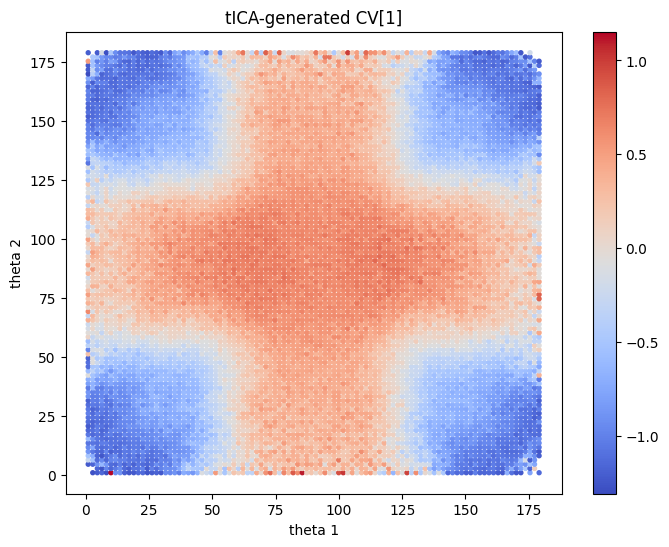

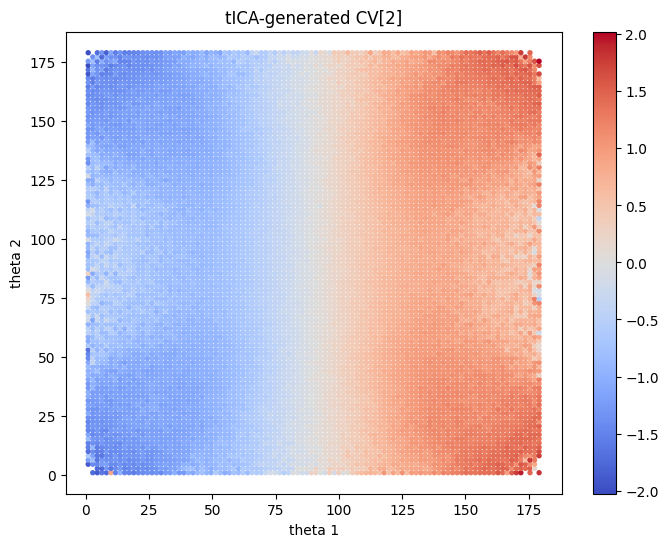

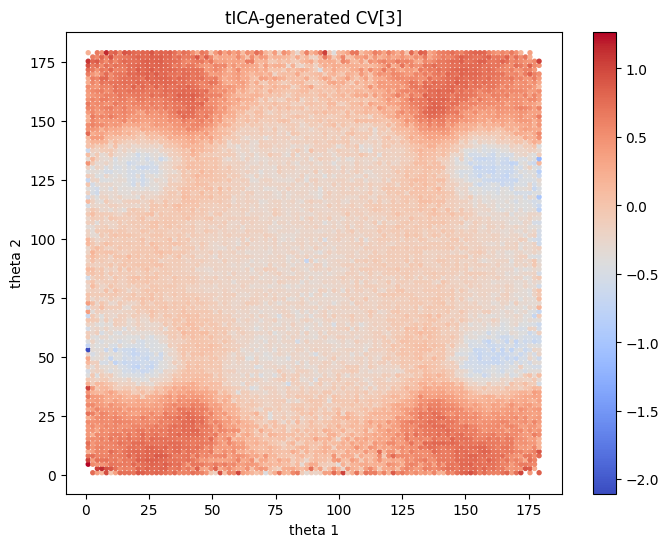

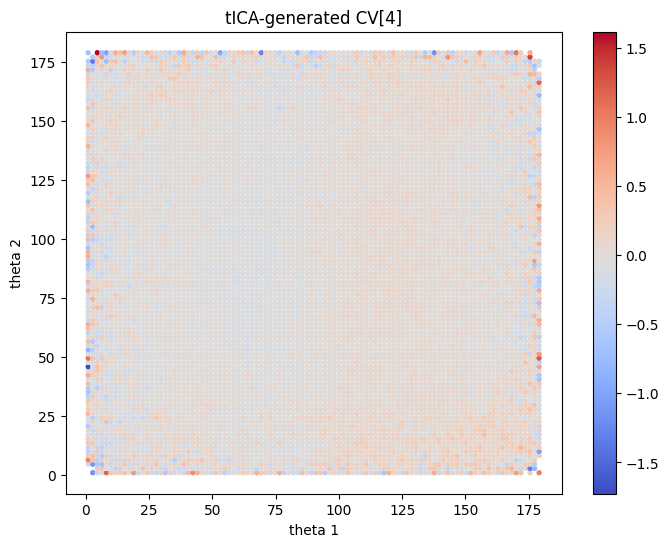

In [28]:
from scipy.stats import binned_statistic_2d

nx, ny = 100, 100

for i in range(4):
    z_mean, x_edges, y_edges, _ = binned_statistic_2d(
        theta[:, 0], theta[:, 1], CV_pwd_all[:, i], statistic="mean", bins=[nx, ny]
    )

    mask = ~np.isnan(z_mean)

    x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing="ij")
    
    plt.figure(figsize=(8,6))
    if i == 1:
        z_mean = -z_mean
    sc = plt.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm")
    plt.colorbar(sc)
    plt.xlabel("theta 1")
    plt.ylabel("theta 2")
    plt.title(f"tICA-generated CV[{i+1}]")
    plt.show()


-1.4394573713561019 -7.592122788047735e-05 2.7508139828378373
-2.7951374872225916 0.00013919770114260576 2.6271737465367684


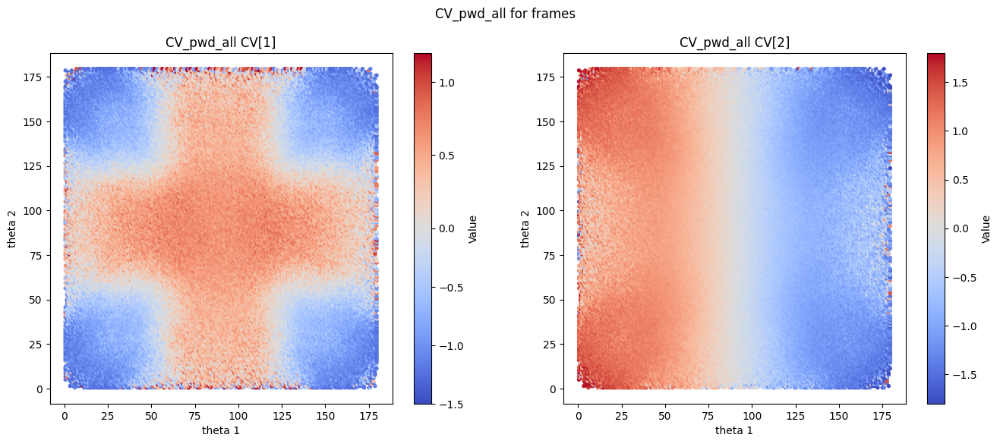

In [29]:
from scipy.stats import binned_statistic_2d

nx, ny = 200, 200
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
plots_save = []

for i, ax in enumerate(axes.ravel()):
    CVi = CV_pwd_all[:, i]
    print(np.min(CVi), np.mean(CVi), np.max(CVi))
    
    z_mean, x_edges, y_edges, _ = binned_statistic_2d(
        theta[:, 0], theta[:, 1], CVi, statistic="mean", bins=[nx, ny]
    )

    mask = ~np.isnan(z_mean)

    x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing="ij")
    if i == 0:
        norm = colors.TwoSlopeNorm(vmin=-1.5, vcenter=0, vmax=1.2)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    elif i == 1:
        norm = colors.TwoSlopeNorm(vmin=-1.8, vcenter=0, vmax=1.8)#np.median(CVi)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    else:
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm")
    ax.set_xlabel("theta 1")
    ax.set_ylabel("theta 2")
    ax.set_title(f"CV_pwd_all CV[{i+1}]")
    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label("Value")
    plots_save.append(z_mean)

    #     arr[np.isnan(arr)] = -10
    
fig.suptitle('CV_pwd_all for frames')
plt.show()

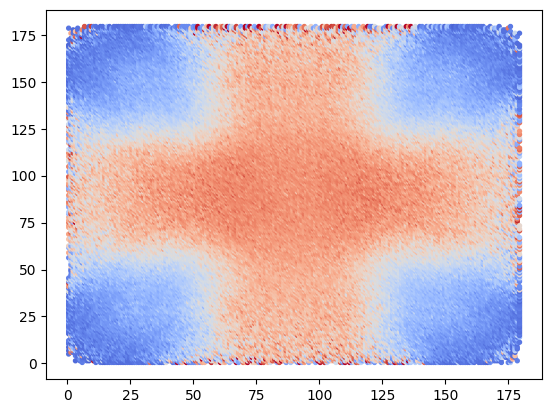

CV[1] done


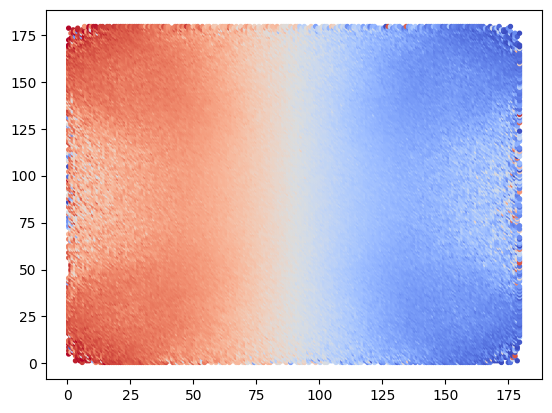

CV[2] done


In [30]:
x_out = Xc.reshape((-1))
y_out = Yc.reshape((-1))

vmin = [-1.5, -1.8]
vmean = [0, 0]
vmax = [1.2, 1.8]

for i in range(len(plots_save)):
    data_output = plots_save[i].reshape((-1))
    np.nan_to_num(data_output, nan=-10, copy=False)
    with open(f"9d9f_CV_pwd_all-mode{i+1}_data.txt", "w") as f:
        mask = data_output == -10
        norm = colors.TwoSlopeNorm(vmin=vmin[i], vcenter=vmean[i], vmax=vmax[i])
        plt.scatter(x_out[~mask], y_out[~mask], c=data_output[~mask], s=8, cmap="coolwarm", norm=norm)
        plt.show()
        for j in range(len(data_output)):
            f.write(f"{x_out[j]:.3f} {y_out[j]:.3f} {data_output[j]:.10f}\n")
    
    print(f"CV[{i+1}] done")

## 3. Sorted tICs

In [22]:
CV_tica = np.load("9d9f_inv_2tics.npy")
print(CV_tica.shape)
CV_tica_all = CV_tica.reshape((-1, CV_tica.shape[-1]))

(40, 50001, 2)


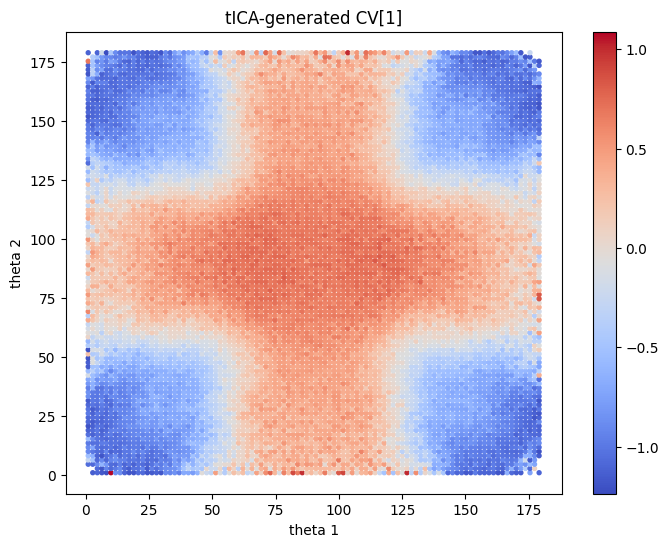

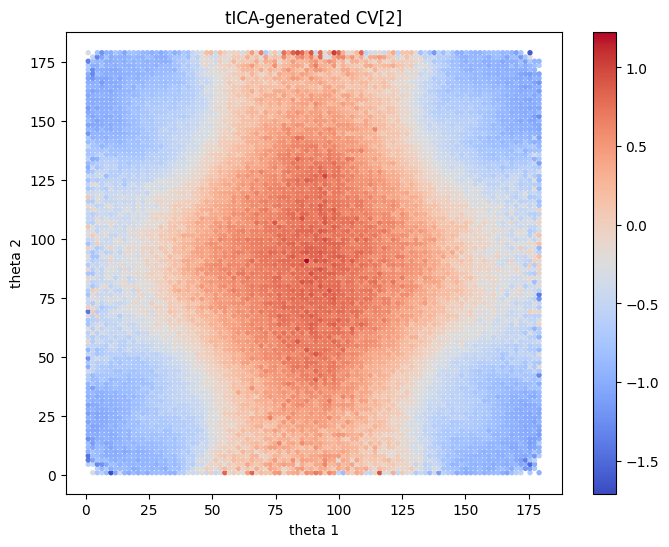

In [23]:
from scipy.stats import binned_statistic_2d

nx, ny = 100, 100

for i in range(2):
    z_mean, x_edges, y_edges, _ = binned_statistic_2d(
        theta[:, 0], theta[:, 1], CV_tica_all[:, i], statistic="mean", bins=[nx, ny]
    )

    mask = ~np.isnan(z_mean)

    x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing="ij")
    
    plt.figure(figsize=(8,6))
    if i == 1:
        z_mean = -z_mean
    sc = plt.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm")
    plt.colorbar(sc)
    plt.xlabel("theta 1")
    plt.ylabel("theta 2")
    plt.title(f"tICA-generated CV[{i+1}]")
    plt.show()

-1.404068190927029 -5.0121550375338176e-05 2.625150286657816
-3.5655137753364463 -0.00013118777891562027 3.5023192055283645


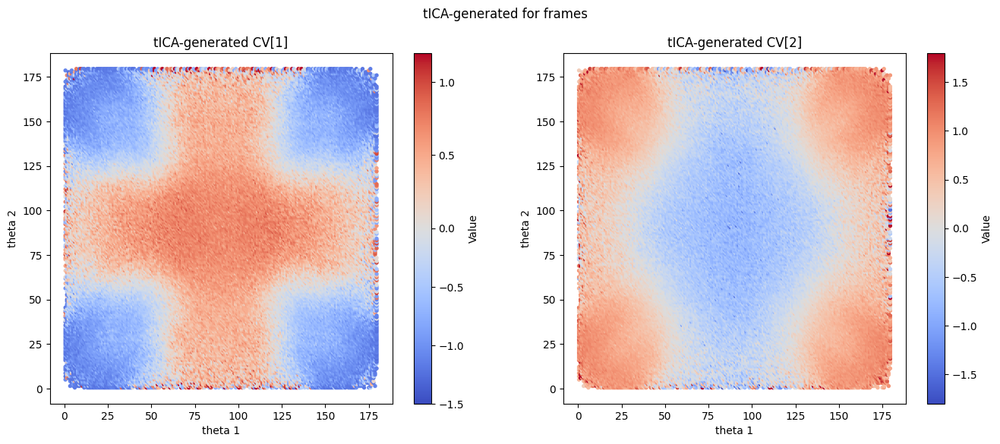

In [25]:
from scipy.stats import binned_statistic_2d

nx, ny = 200, 200
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
plots_save = []

for i, ax in enumerate(axes.ravel()):
    CVi = CV_tica_all[:, i]
    print(np.min(CVi), np.mean(CVi), np.max(CVi))
    
    z_mean, x_edges, y_edges, _ = binned_statistic_2d(
        theta[:, 0], theta[:, 1], CVi, statistic="mean", bins=[nx, ny]
    )

    mask = ~np.isnan(z_mean)

    x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing="ij")
    if i == 0:
        norm = colors.TwoSlopeNorm(vmin=-1.5, vcenter=0, vmax=1.2)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    elif i == 1:
        norm = colors.TwoSlopeNorm(vmin=-1.8, vcenter=0, vmax=1.8)#np.median(CVi)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    else:
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm")
    ax.set_xlabel("theta 1")
    ax.set_ylabel("theta 2")
    ax.set_title(f"tICA-generated CV[{i+1}]")
    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label("Value")
    plots_save.append(z_mean)

    #     arr[np.isnan(arr)] = -10
    
fig.suptitle('tICA-generated for frames')
plt.show()

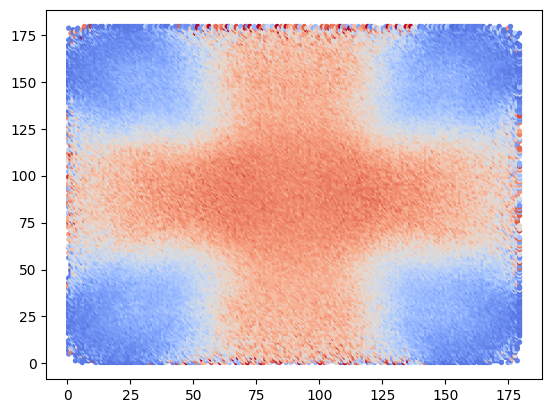

CV[1] done


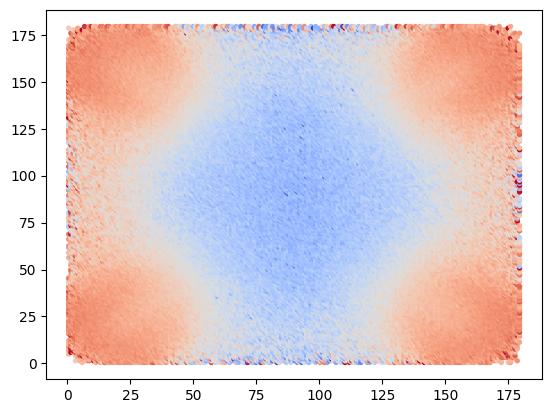

CV[2] done


In [26]:
x_out = Xc.reshape((-1))
y_out = Yc.reshape((-1))

vmin = [-1.5, -1.8]
vmean = [0, 0]
vmax = [1.2, 1.8]

for i in range(len(plots_save)):
    data_output = plots_save[i].reshape((-1))
    np.nan_to_num(data_output, nan=-10, copy=False)
    with open(f"9d9f_tICA-generated-mode{i+1}_data.txt", "w") as f:
        mask = data_output == -10
        norm = colors.TwoSlopeNorm(vmin=vmin[i], vcenter=vmean[i], vmax=vmax[i])
        plt.scatter(x_out[~mask], y_out[~mask], c=data_output[~mask], s=8, cmap="coolwarm", norm=norm)
        plt.show()
        for j in range(len(data_output)):
            f.write(f"{x_out[j]:.3f} {y_out[j]:.3f} {data_output[j]:.10f}\n")
    
    print(f"CV[{i+1}] done")

## SVD 

In [31]:
# if using the saved data, skip to the CVs_ generation box
using_saved_data = True
if using_saved_data:
    Vt = np.load("9d9f-dim25-SVD-Vt.npy")
    print(Vt.shape)

(25, 2000040)


In [10]:
if not using_saved_data:
    tics_all_trajs = np.load("9d9f_inv_2tics.npy")
    tics_of_trajs = tics_all_trajs.reshape((-1, 2))
    print(tics_of_trajs.shape)

In [11]:
if not using_saved_data:
    psi_all = []
    for t in range(tics_of_trajs.shape[0]):
        psi_t = [1.0] + [np.exp(- (tics_of_trajs[t][0] - basis_list[0][j][0])**2 / (2 * basis_list[0][j][1]**2))
                         for j in range(len(basis_list[0]))]
        for i in range(1, len(basis_list)):
            phi_temp = [1.0] + [np.exp(- (tics_of_trajs[t][i] - basis_list[i][j][0])**2 / (2 * basis_list[i][j][1]**2))
                         for j in range(len(basis_list[i]))]
            psi_t = np.kron(psi_t, phi_temp)
        psi_all.append(psi_t)

    Psi = np.stack(psi_all, axis=1)
    Psi.shape

In [12]:
if not using_saved_data:
    U, S, Vt = np.linalg.svd(Psi, full_matrices=False)
    np.save("9d9f-dim25-SVD-Vt.npy", Vt)
    # frame gap = 2ps
Vt.shape

(25, 2000040)

## 4. AMUSET-TICA

In [39]:
# skip to here after reading file
CVs_ = np.matmul(Vs[85][:, :5].T, Vt)
CVs_[0].min(), CVs_[0].max(), len(CVs_[0])

(-0.0007070997102248018, -0.000707099710224757, 2000040)

-0.001915085824094087 -2.015775971406529e-07 0.0009836951912682882
-0.0022161540786727915 5.780467866938776e-07 0.003864829247365733


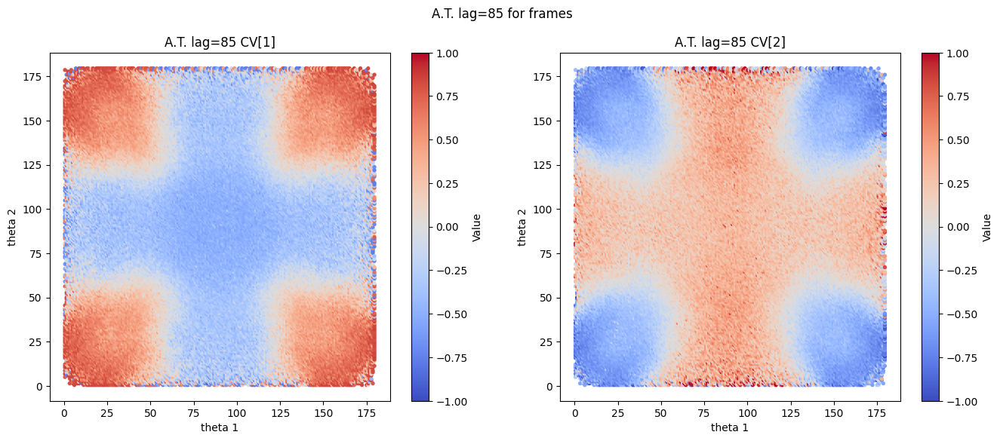

In [44]:
from scipy.stats import binned_statistic_2d

nx, ny = 200, 200
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
plots_save = []

for i, ax in enumerate(axes.ravel()):
    CVi = CVs_[i+1]
    print(np.min(CVi), np.mean(CVi), np.max(CVi))
    
    z_mean, x_edges, y_edges, _ = binned_statistic_2d(
        theta[:, 0], theta[:, 1], CVi, statistic="mean", bins=[nx, ny]
    )
    z_mean *= 1000

    mask = ~np.isnan(z_mean)

    x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing="ij")
    if i == 0:
        norm = colors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    elif i == 1:
        norm = colors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)#np.median(CVi)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    else:
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm")
    ax.set_xlabel("theta 1")
    ax.set_ylabel("theta 2")
    ax.set_title(f"A.T. lag=85 CV[{i+1}]")
    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label("Value")
    plots_save.append(z_mean)

    #     arr[np.isnan(arr)] = -10
    
fig.suptitle('A.T. lag=85 for frames')
plt.show()

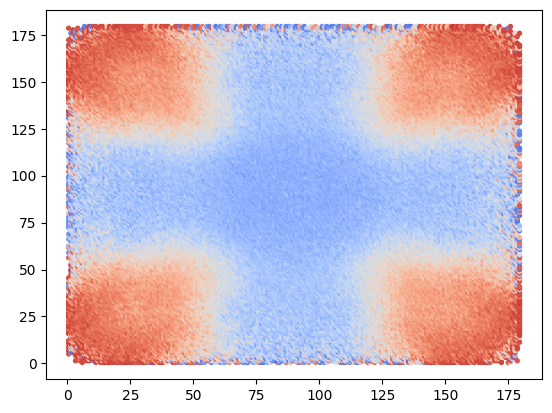

CV[1] done


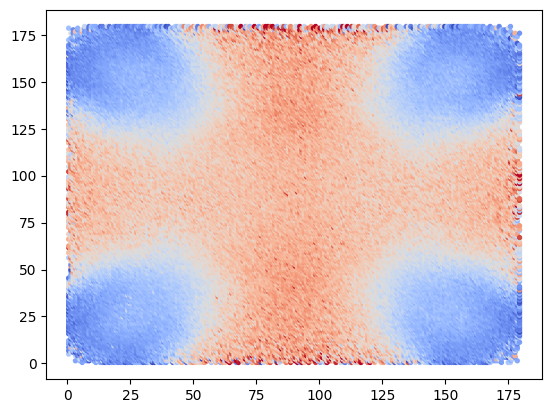

CV[2] done


In [45]:
x_out = Xc.reshape((-1))
y_out = Yc.reshape((-1))

vmin = [-1, -1]
vmean = [0, 0]
vmax = [1, 1]

for i in range(len(plots_save)):
    data_output = plots_save[i].reshape((-1))
    np.nan_to_num(data_output, nan=-10, copy=False)
    with open(f"9d9f_ATlag85-mode{i+1}_data.txt", "w") as f:
        mask = data_output == -10
        norm = colors.TwoSlopeNorm(vmin=vmin[i], vcenter=vmean[i], vmax=vmax[i])
        plt.scatter(x_out[~mask], y_out[~mask], c=data_output[~mask], s=8, cmap="coolwarm", norm=norm)
        plt.show()
        for j in range(len(data_output)):
            f.write(f"{x_out[j]:.3f} {y_out[j]:.3f} {data_output[j]:.10f}\n")
    
    print(f"CV[{i+1}] done")

## 5. A.T.-IGME: Propogation

In [32]:
st, en, step = 65, 20+65, 100

M_hat, info = fit_M_from_K_sequence(Ks[:en], st, 1, enforce_hermitian_M=False)
A_hat = fit_A_from_K0_and_M(Ks[st], M_hat)
Ks_model = generate_K_from_A_M(A_hat, M_hat, step+en-st)

print(len(Ks_model), Ks_model[-1].shape)
#print(Ks_model[-1])

K_e, K_v = np.linalg.eig(Ks_model[-1])
idx = np.argsort(K_e)[::-1]
K_e = K_e[idx]
K_v = K_v[:,idx]

CVs_Khat = np.matmul(K_v[:, :5].T, Vt)
print(K_e[:10])
print(-1.0*(st+en+step)/np.log(K_e[1:10])) # multiply by lag_time

120 (25, 25)
[1.00000000e+00+0.00000000e+00j 6.51490336e-01+0.00000000e+00j
 2.71754394e-02+0.00000000e+00j 7.02687257e-03+0.00000000e+00j
 3.08865899e-03+0.00000000e+00j 2.31586986e-04+0.00000000e+00j
 4.43481296e-05+0.00000000e+00j 1.11992619e-05+0.00000000e+00j
 7.96154993e-15+1.51034289e-14j 7.96154993e-15-1.51034289e-14j]
[583.44049059-0.j          69.33963226-0.j
  50.42342017-0.j          43.25245848-0.j
  29.86659784-0.j          24.94153698-0.j
  21.93047346-0.j           7.87688418+0.26976064j
   7.87688418-0.26976064j]


-0.0019129302231930235 -3.34784079409289e-07 0.0010090567459037382
-0.002414349543175102 6.242971260017081e-07 0.0021787719724169607


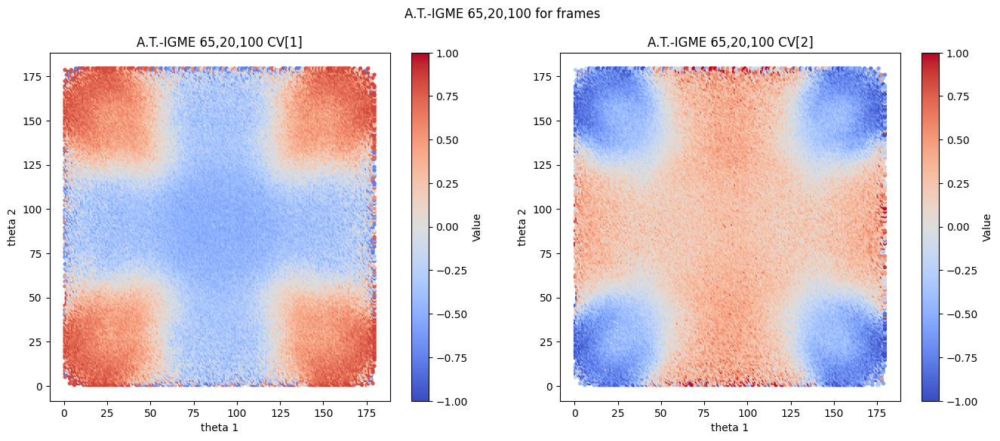

In [36]:
from scipy.stats import binned_statistic_2d

nx, ny = 200, 200
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
plots_save = []

for i, ax in enumerate(axes.ravel()):
    CVi = np.real(CVs_Khat[i+1])
    print(np.min(CVi), np.mean(CVi), np.max(CVi))
    
    z_mean, x_edges, y_edges, _ = binned_statistic_2d(
        theta[:, 0], theta[:, 1], CVi, statistic="mean", bins=[nx, ny]
    )

    z_mean *= 1000
    mask = ~np.isnan(z_mean)

    x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing="ij")
    if i == 0:
        norm = colors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    elif i == 1:
        norm = colors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)#np.median(CVi)
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm", norm=norm)
    else:
        sc = ax.scatter(Xc[mask], Yc[mask], c=z_mean[mask], s=8, cmap="coolwarm")
    ax.set_xlabel("theta 1")
    ax.set_ylabel("theta 2")
    ax.set_title(f"A.T.-IGME 65,20,100 CV[{i+1}]")
    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label("Value")
    plots_save.append(z_mean)

    #     arr[np.isnan(arr)] = -10
    
fig.suptitle('A.T.-IGME 65,20,100 for frames')
plt.show()

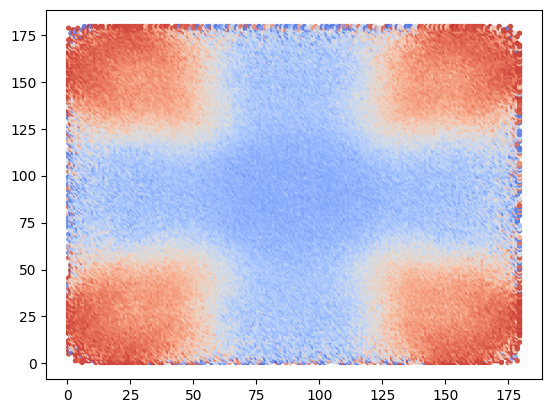

CV[1] done


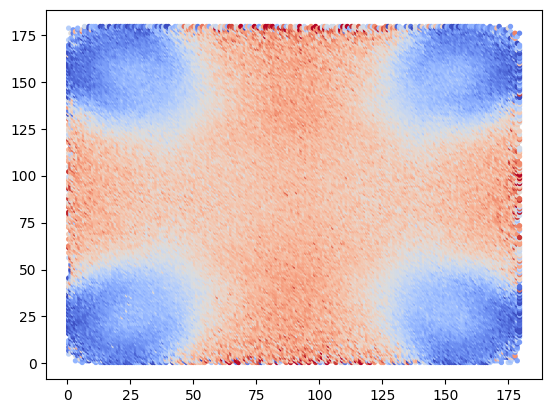

CV[2] done


In [38]:
x_out = Xc.reshape((-1))
y_out = Yc.reshape((-1))

vmin = [-1, -1]
vmean = [0, 0]
vmax = [1, 1]

for i in range(len(plots_save)):
    data_output = plots_save[i].reshape((-1))
    np.nan_to_num(data_output, nan=-10, copy=False)
    with open(f"9d9f_A.T.IGME-mode{i+1}_data.txt", "w") as f:
        mask = data_output == -10
        norm = colors.TwoSlopeNorm(vmin=vmin[i], vcenter=vmean[i], vmax=vmax[i])
        plt.scatter(x_out[~mask], y_out[~mask], c=data_output[~mask], s=8, cmap="coolwarm", norm=norm)
        plt.show()
        for j in range(len(data_output)):
            f.write(f"{x_out[j]:.3f} {y_out[j]:.3f} {data_output[j]:.10f}\n")
    
    print(f"CV[{i+1}] done")